In [1]:
import os
!CUDA_LAUNCH_BLOCKING=1

In [2]:

"""
  run and restart runtime once, av library needs that for some reason, it is need 
"""
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils as torchU
from torch.autograd import Variable
import torchvision
from torchvision import datasets, models, transforms

!pip install pytorch_lightning==0.9.1rc4
import pytorch_lightning as torch_light

import math
import numpy as np
from matplotlib import pyplot as plt
import cProfile, pstats

# https://github.com/VainF/pytorch-msssim
!pip install pytorch-msssim
import pytorch_msssim as py_ssim

!pip install av

In [5]:
"""
  profiling single parts for comparison; optional part of code
"""
profiler = cProfile.Profile()
profiler.enable()
for i in range(3000):
  # ur stuff
  profiler.disable()
stats = pstats.Stats(profiler).sort_stats('cumtime')
stats.print_stats()

         10 function calls in 0.000 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000    0.000    0.000 /usr/lib/python3.6/codeop.py:132(__call__)
        1    0.000    0.000    0.000    0.000 /usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2852(run_code)
        1    0.000    0.000    0.000    0.000 {built-in method builtins.compile}
        1    0.000    0.000    0.000    0.000 {built-in method builtins.exec}
        1    0.000    0.000    0.000    0.000 <ipython-input-5-cd756fea87fc>:6(<module>)
        1    0.000    0.000    0.000    0.000 /usr/local/lib/python3.6/dist-packages/IPython/core/hooks.py:139(__call__)
        1    0.000    0.000    0.000    0.000 /usr/local/lib/python3.6/dist-packages/IPython/utils/ipstruct.py:125(__getattr__)
        1    0.000    0.000    0.000    0.000 {method 'disable' of '_lsprof.Profiler' objects}
        1    0.000    0.000    0.000 

In [6]:
%cd "/content/drive/My Drive/Colab Notebooks"
!ls

/content/drive/My Drive/Colab Notebooks
 classification_model_tl.ipynb	    logs
'Copy of pred_model_tl_V12.ipynb'   pred_model_tl_thefinal.ipynb
'Cuda Vision Project'		    train_model_1_V_tl.ipynb


List of own or others modules:<br> 
own: Paraleller<br>
others: ConvGRU, LD_conv2d 

In [7]:
"""
  code is taken from following Git-repository:
  https://github.com/happyjin/ConvGRU-pytorch.git
  ConvLSTM_pytorch is released under the MIT License (refer to the LICENSE file for details).
"""
class ConvGRU(nn.Module):
  def __init__(self, input_size, input_dim, hidden_dim, kernel_size, bias, dtype, batch_size):
    """
    Initialize the ConvLSTM cell
    :param input_size: (int, int)
        Height and width of input tensor as (height, width).
    :param input_dim: int
        Number of channels of input tensor.
    :param hidden_dim: int
        Number of channels of hidden state.
    :param kernel_size: (int, int)
        Size of the convolutional kernel.
    :param bias: bool
        Whether or not to add the bias.
    :param dtype: torch.cuda.FloatTensor or torch.FloatTensor
        Whether or not to use cuda.
    """
    super(ConvGRU, self).__init__()
    self.height, self.width = input_size
    self.padding = kernel_size // 2, kernel_size // 2
    self.hidden_dim = hidden_dim
    self.bias = bias
    self.dtype = dtype
    self.init_hidden(batch_size)

    self.conv_gates = nn.Conv2d(in_channels=input_dim + hidden_dim,
                                out_channels=2*self.hidden_dim,  # for update_gate,reset_gate respectively
                                kernel_size=kernel_size,
                                padding=self.padding,
                                bias=self.bias)

    self.conv_can = nn.Conv2d(in_channels=input_dim+hidden_dim,
                          out_channels=self.hidden_dim, # for candidate neural memory
                          kernel_size=kernel_size,
                          padding=self.padding,
                          bias=self.bias)
  def init_hidden(self, batch_size):
    self.h_cur = (Variable(torch.zeros(batch_size, self.hidden_dim, self.height, self.width)).type(self.dtype))
  def forward(self, input_tensor):
    """
    :param self:
    :param input_tensor: (b, c, h, w)
        input is actually the target_model
    :param h_cur: (b, c_hidden, h, w)
        current hidden and cell states respectively
    :return: h_next,
        next hidden state
    """
    self.check_device(input_tensor)
    combined = torch.cat([input_tensor, self.h_cur], dim=1)
    combined_conv = self.conv_gates(combined)

    gamma, beta = torch.split(combined_conv, self.hidden_dim, dim=1)
    reset_gate = torch.sigmoid(gamma)
    update_gate = torch.sigmoid(beta)

    combined = torch.cat([input_tensor, reset_gate*self.h_cur], dim=1)
    cc_cnm = self.conv_can(combined)
    cnm = torch.tanh(cc_cnm)

    h_next = (1 - update_gate) * self.h_cur + update_gate * cnm
    self.h_cur = h_next.clone()
    return h_next
  def check_device(self,input_tensors):
    if self.h_cur.device != input_tensors.device:
      self.h_cur.data = self.h_cur.to(input_tensors.get_device())

In [8]:
"""
  test code for convGRU
"""
convGru = ConvGRU((32,32),64,128,3,bias=False,dtype=torch.FloatTensor,batch_size=128)
A = torch.rand((128,64,32,32))
B = convGru(A)
print(B.shape)

torch.Size([128, 128, 32, 32])


In [9]:
"""
  This module is provided from our supervisor Hafez Farazi
  related paper: http://ais.uni-bonn.de/~hfarazi/papers/LocDep.pdf
  code also provided from: https://github.com/AIS-Bonn/LocDepVideoPrediction.git
"""
class LocationAwareConv2d(torch.nn.Conv2d):
    def __init__(self,w,h,in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True):
        super().__init__(in_channels, out_channels, kernel_size, stride=stride, padding=padding, dilation=dilation, groups=groups, bias=bias)
        self.locationBias=torch.nn.Parameter(torch.zeros(w,h,3))
        self.locationEncode=torch.autograd.Variable(torch.ones(w,h,3))
    def forward(self,inputs):
        if self.locationBias.device != inputs.device:
            self.locationBias.data=self.locationBias.to(inputs.get_device())
        if self.locationEncode.device != inputs.device:
            self.locationEncode.data=self.locationEncode.to(inputs.get_device())
        b=self.locationBias*self.locationEncode
        return super().forward(inputs)+b[:,:,0]+b[:,:,1]+b[:,:,2]

In [10]:
"""
  test code for LocationAwareConv2d
"""
convLoc = LocationAwareConv2d(w=32,h=32,in_channels=64,out_channels=64,kernel_size=1)
A = torch.rand((32,64,32,32))
B = convLoc(A)
print(B.shape)

torch.Size([32, 64, 32, 32])


In [11]:
"""
  module to deal with midblocks of model 1; simple paralell processing containers
"""
class Paraleller(nn.Module):
  def __init__(self,list_of_modules):
    super(Paraleller, self).__init__()
    self.module_list = nn.ModuleList(list_of_modules)
  def forward(self, x):
    ans = []
    for module in self.module_list:
      ans.append(module(x))
    return ans

In [12]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

In [13]:
class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.sub_(m).div_(s)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

In [15]:
"""
  download the dataset and annonations
"""
%cd "/content"
!ls
!wget https://www.crcv.ucf.edu/data/UCF101/UCF101.rar --no-check-certificate
!wget https://www.crcv.ucf.edu/data/UCF101/UCF101TrainTestSplits-RecognitionTask.zip --no-check-certificate

/content
drive  sample_data
--2020-10-21 17:07:45--  https://www.crcv.ucf.edu/data/UCF101/UCF101.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 6932971618 (6.5G) [application/rar]
Saving to: ‘UCF101.rar’

UCF101.rar          100%[===================>]   6.46G  38.9MB/s    in 2m 47s  

2020-10-21 17:10:33 (39.5 MB/s) - ‘UCF101.rar’ saved [6932971618/6932971618]

--2020-10-21 17:10:33--  https://www.crcv.ucf.edu/data/UCF101/UCF101TrainTestSplits-RecognitionTask.zip
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 113943 (111K) [application/zip]
Saving to: ‘UCF101TrainTestSpli

In [16]:
"""
  unpack downloaded dataset and annnonations
"""
get_ipython().system_raw("unrar x UCF101.rar")
!unzip UCF101TrainTestSplits-RecognitionTask.zip

Archive:  UCF101TrainTestSplits-RecognitionTask.zip
   creating: ucfTrainTestlist/
  inflating: ucfTrainTestlist/classInd.txt  
  inflating: ucfTrainTestlist/testlist01.txt  
  inflating: ucfTrainTestlist/testlist02.txt  
  inflating: ucfTrainTestlist/testlist03.txt  
  inflating: ucfTrainTestlist/trainlist01.txt  
  inflating: ucfTrainTestlist/trainlist02.txt  
  inflating: ucfTrainTestlist/trainlist03.txt  


In [17]:
# important constants:
frames_per_clip = 24
frames_between_clip = 60
inp_dim=128
if torch.cuda.is_available():
  device = 'cuda'
else:
  device = 'cpu'

In [18]:
"""
  function to plot pictures
"""
def imshow(inp,fig_size):
  inp = torchvision.utils.make_grid(inp)
  """Imshow for Tensor."""
  plt.figure(figsize = fig_size)
  inp = inp.permute((1, 2, 0))
  plt.imshow(inp.detach().cpu())
  plt.pause(0.001)  # pause a bit so that plots are updated

In [19]:
"""
  create the dataset to "train" the model
"""
ufc101_dset_train = datasets.UCF101(root="UCF-101",
                                    annotation_path="ucfTrainTestlist", 
                                    frames_per_clip=frames_per_clip,
                                    step_between_clips=frames_between_clip,
                                    train=True,
                                    transform=None)

From here we will list all our transformation(image,video and batches)<br>
First image transformations

In [20]:
def transform_video(video,tf):
  tmp = []
  for frame in video:
    frame = frame.cpu()
    tmp.append(tf(frame))
  return torch.stack(tmp,dim=0)

In [21]:
def transform_batch(batch,tf):
  tmp = []
  for video in batch:
    tmp.append(tf(video))
  return torch.stack(tmp,dim=0).to(device)

In [22]:
def validate_for_PIL_transformation(inp):
  # assumption: input is a frame, need c,h,w not h,w,c for PIL transfer(mentioned in docs)
  if inp.shape[0] != 3:
    return inp.permute(2,0,1)
  else:
    return inp

In [23]:
"""
  cell for frame transformations
"""
unNorm_f = UnNormalize( mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
Norm_f = Normalize( mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225])
cJ = 0.33
t_frame_train = transforms.Compose([
            transforms.Lambda(lambda x: validate_for_PIL_transformation(x)),
            transforms.Lambda(lambda x: x / 255.),
            # transform to PIL image
            transforms.ToPILImage(),
            # resnet augementations
            transforms.ColorJitter(
              brightness = cJ,
              contrast = cJ,
              saturation = cJ,
            ),
            transforms.RandomHorizontalFlip(),
            transforms.RandomResizedCrop(
                size=inp_dim,
                scale=(0.9,1.0)
            ),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
])
t_frame_val = transforms.Compose([
            # order of frames is h,w,c -> c,h,w
            transforms.Lambda(lambda x: validate_for_PIL_transformation(x)),
            transforms.Lambda(lambda x: x / 255.),
            # transform to PIL image
            transforms.ToPILImage(),
            # resnet augementations
            transforms.RandomHorizontalFlip(),
            transforms.Resize((inp_dim,inp_dim)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
])
t_frame_test = transforms.Compose([
            # order of frames is h,w,c -> c,h,w
            transforms.Lambda(lambda x: validate_for_PIL_transformation(x)),
            transforms.Lambda(lambda x: x / 255.),
            # transform to PIL image
            transforms.ToPILImage(),
            # resnet augementations
            transforms.Resize((inp_dim,inp_dim)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
])

In [24]:
"""
  cell for video transformations
"""
unNorm_v = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_video(x,unNorm_f)),
    ])
Norm_v = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_video(x,Norm_f)),
    ])
t_video_train = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_video(x,t_frame_train)),
    ])
t_video_val = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_video(x,t_frame_val)),
    ])
t_video_test = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_video(x,t_frame_test)),
    ])

In [25]:
"""
  cell for batch transformations
"""
unNorm_b = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_batch(x,unNorm_v)),
    ])
Norm_b = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_batch(x,Norm_v)),
    ])
t_batch_train = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_batch(x,t_video_train)),
    ])
t_batch_val = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_batch(x,t_video_val)),
    ])
t_batch_test = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_batch(x,t_video_test)),
    ])

In [26]:
"""
  this is a generic function which can take any data and transformation as input 
  and can deal with frames, videos and batches
"""
def tensor_generic_transformation(inp,tf):
  # detect mode
  mode = inp.dim()
  if mode == 5:
    return tf[0](inp).to(device)
  elif mode == 4:
    return tf[1](inp).to(device)
  elif mode == 3:
    return tf[2](inp).to(device)

In [27]:
"""
  transformation cell for tensor_generic_transformation
"""
t_train = [t_batch_train,t_video_train,t_frame_train]
t_val = [t_batch_val,t_video_val,t_frame_val]
t_test = [t_batch_test,t_video_test,t_frame_test]
Norm = [Norm_b,Norm_v,Norm_f]
unNorm = [unNorm_b,unNorm_v,unNorm_f]

In [28]:
"""
  resizing images to desired size
"""
def tensor_resize(inp,new_size):
  # detect mode
  mode = inp.dim()
  frame_resize = transforms.Compose([
            # order of frames is h,w,c -> c,h,w
            transforms.Lambda(lambda x: validate_for_PIL_transformation(x)),
            # transform to PIL image
            transforms.ToPILImage(),
            transforms.Resize((new_size,new_size)),
            transforms.ToTensor(),
])
  video_resize = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_video(x,frame_resize)),
    ])
  batch_resize = transforms.Compose([
            # magic looping function
            transforms.Lambda(lambda x: transform_batch(x,video_resize)),
    ])
  if mode == 5:
    return batch_resize(inp).to(device)
  elif mode == 4:
    return video_resize(inp).to(device)
  elif mode == 3:
    return frame_resize(inp).to(device)

In [29]:
"""
  create the dataset to "test" the model
"""
ufc101_dset_test = datasets.UCF101(root="UCF-101",
                                    annotation_path="ucfTrainTestlist", 
                                    frames_per_clip=frames_per_clip,
                                    step_between_clips=frames_between_clip,
                                    train=False,
                                    transform=None
)

/usr/local/lib/python3.6/dist-packages/torchvision/io/video.py:106: UserWarning: The pts_unit 'pts' gives wrong results and will be removed in a follow-up version. Please use pts_unit 'sec'.
  + "follow-up version. Please use pts_unit 'sec'."


torch.Size([3, 128, 128])
torch.Size([3, 128, 128])
torch.float32 torch.float32
tensor(0.9020, device='cuda:0') tensor(0.0157, device='cuda:0')
tensor(0.9020, device='cuda:0') tensor(0.0157, device='cuda:0')
tensor(1., device='cuda:0')


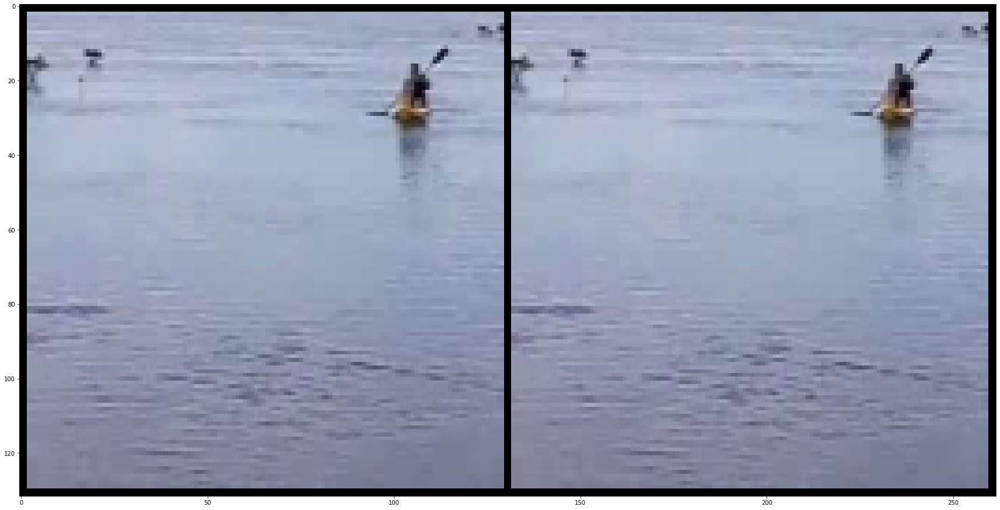

In [31]:
"""
  This cell test tensor_resize
"""
rnd_number = int(torch.randint(len(ufc101_dset_train),size=(1,)))
video = ufc101_dset_train.__getitem__(rnd_number)[0]
rnd_frame = video[np.random.randint(0,len(video),1)]

rnd_frame_t = tensor_resize(rnd_frame,inp_dim)
rnd_frame_t = rnd_frame_t.reshape(rnd_frame_t.shape[1:])
print(rnd_frame_t.shape)

rnd_frame = tensor_resize(rnd_frame,inp_dim)
rnd_frame = rnd_frame.reshape(rnd_frame.shape[1:])
print(rnd_frame.shape)

stack = torch.stack([rnd_frame.cpu(),rnd_frame_t.cpu()],dim=0)

print(rnd_frame.dtype,rnd_frame_t.dtype)
print(torch.max(rnd_frame),torch.min(rnd_frame))
print(torch.max(rnd_frame_t),torch.min(rnd_frame_t))
ssim = py_ssim.SSIM(data_range=1.0)
print(ssim(rnd_frame_t.reshape((1,)+rnd_frame_t.shape),rnd_frame.reshape((1,)+rnd_frame.shape)))
imshow(stack,(30,20))

/usr/local/lib/python3.6/dist-packages/torchvision/io/video.py:106: UserWarning: The pts_unit 'pts' gives wrong results and will be removed in a follow-up version. Please use pts_unit 'sec'.
  + "follow-up version. Please use pts_unit 'sec'."
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.float32 torch.float32 torch.float32
torch.Size([1, 3, 128, 128]) torch.Size([1, 3, 128, 128])
tensor(0.9961, device='cuda:0') tensor(0., device='cuda:0')
tensor(1.5768, device='cuda:0') tensor(-2.0665, device='cuda:0')
tensor(0.7608, device='cuda:0') tensor(0.0039, device='cuda:0')
tensor(0.4337, device='cuda:0')


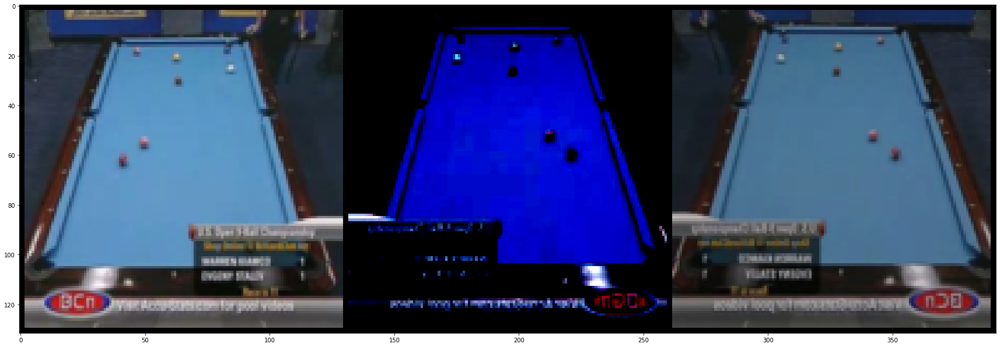

In [33]:
"""
  testing effect of normalization and undoing it
"""
rnd_number = int(torch.randint(len(ufc101_dset_train),size=(1,)))
video = ufc101_dset_train.__getitem__(rnd_number)[0]
rnd_frame = video[np.random.randint(0,len(video),1)]

rnd_frame_t = tensor_generic_transformation(rnd_frame,t_train)
# rnd_frame_t = tensor_generic_transformation(rnd_frame,t_val)
# rnd_frame_t = tensor_generic_transformation(rnd_frame,t_test)

rnd_frame_af_t = rnd_frame_t.clone()
rnd_frame_af_t = tensor_generic_transformation(rnd_frame_af_t,unNorm)

rnd_frame = tensor_resize(rnd_frame,inp_dim)

stack = torch.stack([rnd_frame.view(rnd_frame.shape[1:]),rnd_frame_t.view(rnd_frame_t.shape[1:]),rnd_frame_af_t.view(rnd_frame_af_t.shape[1:])],dim=0)

print(rnd_frame.dtype,rnd_frame_t.dtype,rnd_frame_af_t.dtype)
print(rnd_frame.shape,rnd_frame_af_t.shape)
print(torch.max(rnd_frame),torch.min(rnd_frame))
print(torch.max(rnd_frame_t),torch.min(rnd_frame_t))
print(torch.max(rnd_frame_af_t),torch.min(rnd_frame_af_t))
ssim = py_ssim.SSIM(data_range=1.0)
print(ssim(rnd_frame,rnd_frame_af_t))
imshow(stack,(30,20))

In [35]:
"""
  drawing 6 frames randomly and shuffling them into correct order
"""
def rand_frames(inp,num):
  ans = torch.zeros(size=(inp.shape[0],6)+inp.shape[2:],dtype=torch.float32)
  for i,frames in enumerate(inp):
    tmp = torch.from_numpy(np.random.choice(np.arange(num),size=6,replace=False))
    tmp,_ = torch.sort(tmp)
    ans[i] = inp[i][tmp]
  return ans

In [36]:
"""
  unfortunately i couldnt find the real root cause why i had to implement it like that.
  Handling the test data like train and val data always threw me a error for the correct data size.
  This way its work and i dont want to break it.
"""
def test_special_treatment(inp):
  tmp = []
  for video in inp:
    tmp.append(tensor_generic_transformation(video,t_test))
  return torch.stack(tmp,dim=0).to(device)

In [38]:
def build_batch_and_labels(data,inp_dim,mode):
  if mode == 'test':
    # description for this special above
    data = test_special_treatment(data)
  data = rand_frames(data,frames_per_clip)
  batch = data[:,:data.shape[1]-3,:,:,:]
  labels = data[:,3:,:,:,:]
  """
    for some reason test and train/val data have different data types
    and need specific types to work correctly, i crosschecked with plt.imshow in
    corresponding loop
  """
  if mode == 'test':
    batch = batch.type(torch.float32)
    labels = labels.type(torch.float32)
  else:
    batch = batch.type(torch.uint8)
    labels = labels.type(torch.uint8)
  batch,labels = batch_labels_transform(batch,labels,inp_dim,mode)
  batches = []
  labeles = []
  for i in range(batch.shape[1]):
    b = batch[:,i,:,:,:].to(device)
    l = labels[:,i,:,:,:].to(device)
    batches.append(b)
    labeles.append(l)
  return batches,labeles

In [39]:
def custom_collate(batch):
    filtered_batch = []
    for video, _, label in batch:
        filtered_batch.append((video, label))
    return torch.utils.data.dataloader.default_collate(filtered_batch)

In [40]:
"""
  Here we apply our data augmentations depending for which data set
"""
def batch_labels_transform(batch,labels,inp_dim,mode):
  if mode == 'train':
    batch = tensor_generic_transformation(batch,t_train)
    labels = tensor_generic_transformation(labels,t_train)
    labels = tensor_generic_transformation(labels,unNorm)
    labels = tensor_resize(labels,inp_dim//2)
    labels = tensor_generic_transformation(labels,Norm)
  if mode == 'val':
    batch = tensor_generic_transformation(batch,t_val)
    labels = tensor_generic_transformation(labels,t_val)
    labels = tensor_generic_transformation(labels,unNorm)
    labels = tensor_resize(labels,inp_dim//2)
    labels = tensor_generic_transformation(labels,Norm)
  if mode == 'test':
    # batch = tensor_generic_transformation(batch,t_test)
    # labels = tensor_generic_transformation(labels,t_test)
    labels = tensor_generic_transformation(labels,unNorm)
    labels = tensor_resize(labels,inp_dim//2)
    labels = tensor_generic_transformation(labels,Norm)
  return batch,labels

In [41]:
def custom_collate_test(batch):
    filtered_batch = []
    for video, _, label in batch:
        filtered_batch.append(video)
    return filtered_batch

In [42]:
"""
  loss function wrapper; 4th loss function was just a trying of us to do sth. again
  the copying problem
"""
def calculate_full_loss(batch,pred,labels,hparams):
  batch = tensor_generic_transformation(batch,unNorm)
  batch = tensor_resize(batch,inp_dim//2)
  pred = tensor_generic_transformation(pred,unNorm)
  labels = tensor_generic_transformation(labels,unNorm)
  loss_func_l1 = nn.L1Loss()
  loss_func_l2 = nn.MSELoss()
  loss_func_ssim = py_ssim.SSIM(data_range=1.0)
  l1 = hparams["loss_scale"][0]*(1-loss_func_ssim(pred.cpu(),labels.cpu())/2)
  l2 = hparams["loss_scale"][1]*loss_func_l2(pred,labels)
  l3 = hparams["loss_scale"][2]*loss_func_l1(pred,labels)
  l4 = hparams["loss_scale"][3]*loss_func_ssim(pred.cpu(),batch.cpu())
  return l1+ l2 + l3 + l4,[l3.clone().detach().cpu(),l2.clone().detach().cpu(),l1.clone().detach().cpu()]

/usr/local/lib/python3.6/dist-packages/torchvision/io/video.py:106: UserWarning: The pts_unit 'pts' gives wrong results and will be removed in a follow-up version. Please use pts_unit 'sec'.
  + "follow-up version. Please use pts_unit 'sec'."
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


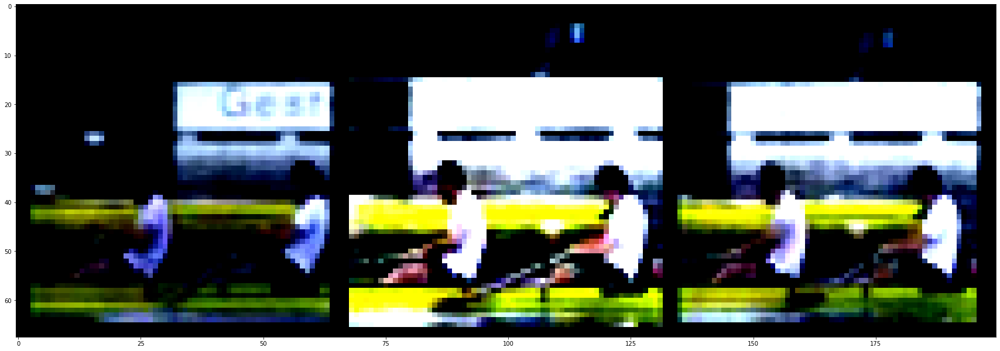

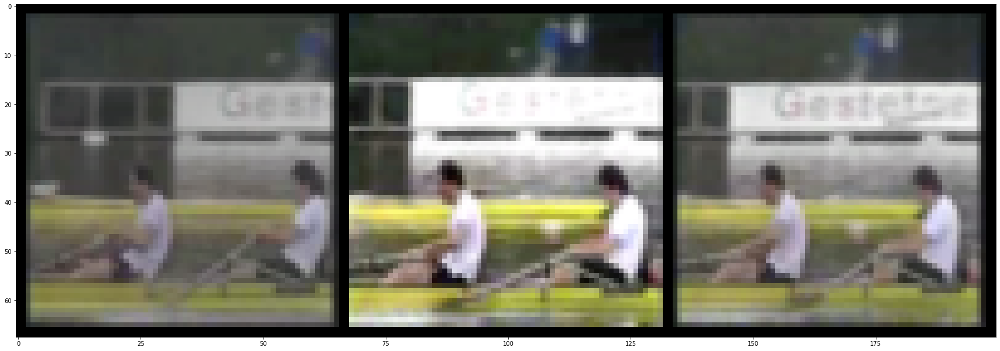

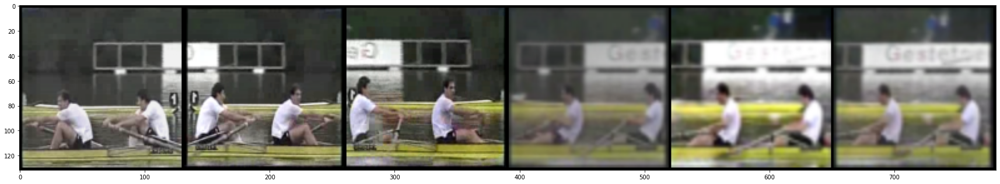

In [43]:
"""
 cell for testing build_batch_and_labels and rand_frames
"""

rnd_number = int(torch.randint(len(ufc101_dset_train),size=(1,)))
# rnd_number = 255
video = ufc101_dset_train.__getitem__(rnd_number)[0]
video = video.permute(0,3,1,2)
batch,labels = build_batch_and_labels(video.reshape((1,)+video.shape),inp_dim,'train')
batch = torch.cat(batch,dim=0)
labels = torch.cat(labels,dim=0)

imshow(labels,(30,20))
labels = tensor_generic_transformation(labels,unNorm)
imshow(labels,(30,20))
labels = tensor_resize(labels,inp_dim)
labels = tensor_generic_transformation(labels,Norm)
b_l = torch.cat([batch,labels],dim=0)
b_l = tensor_generic_transformation(b_l,unNorm)
imshow(b_l,(30,20))

In [44]:
"""
  We implemented our own Early Stopping since the callback for Eearly stopping in
  the pytorch lightning library only supports epochs and not batch step.
  Criterium is a delta value and the best seen value so far.
"""
class MyEarlyStopping:
  def __init__(self,monitor,min_delta,patience,mode,where):
    self.monitor = monitor
    self.min_delta = min_delta
    self.patience = patience
    self.mode = mode
    self.where = where
    self.print_stop = True
    if mode == 'min':
      self.best_val = 1e10
    else:
      self.best_val = 1e10
  def stop_early(self,dic,called):
    if not self.print_stop:
      return True
    if self.where != called:
      return False
    if len(dic[self.monitor]) <= 1:
      return False
    if self.patience == 0:
      if self.print_stop:
        print("Training will be stopped early, patience == 0")
        self.print_stop = False
      return True
    new_val = dic[self.monitor][-1]
    if new_val < self.best_val:
      self.best_val = new_val
      return False
    elif new_val - self.best_val > self.min_delta:
      self.patience -= 1
    return False
  def reset(self,new_patience):
    self.patience = new_patience
    self.print_stop = True
  def prop(self):
    print("(monitor/min_delta/patience/mode/where/print_stop): (",
          self.monitor,"/",
          self.min_delta,"/",
          self.patience,"/",
          self.mode,"/",
          self.where,"/",
          self.print_stop,")")

In [45]:
def calculate_split(dataset_len,batch_size):
  len1 = int(dataset_len*0.7)
  while len1%batch_size!=0:
    len1-=len1%batch_size
  len2 = dataset_len-len1
  return len1,len2

In [46]:
class pred_Project(torch_light.LightningModule):
  def __init__(self, hparams):
    super(pred_Project, self).__init__()
    self.hparams = hparams
    self.train_step_count = 0
    self.val_step_count = 0
    self.test_step_count = 0
    self.stop_early = False
    """
      extra log dic
    """
    self.log_dic = {
        "train/step/loss": [],
        "train/step/l1_loss": [],
        "train/step/MSE_loss": [],
        "train/step/DSSIM_loss": [],
        "val/step/loss": [],
        "val/step/l1_loss": [],
        "val/step/MSE_loss": [],
        "val/step/DSSIM_loss": [],
        "test/step/loss": [],
        "test/step/l1_loss": [],
        "test/step/MSE_loss": [],
        "test/step/DSSIM_loss": [],
        "loss_scaling": self.hparams["loss_scale"],
        "model_weight_step": [],
        "learnrate": [],
        "retrained":[]
    }
    """
      load pretrained resnet18
    """
    self.resnet = models.resnet18(pretrained=True)
    
    """
      some constants of the network
    """
    inp_size = self.hparams["input_dim"] #assumption number is even and power of 2
    true_batchsize = self.hparams["batch_size"]
    """
      create a partial layer of the proposed network and structure them in packs
    """
    #BN+Relu+Maxpool
    self.pre_block = nn.Sequential(
        self.resnet.bn1,
        self.resnet.relu,
        self.resnet.maxpool
    )
    self.midblocks = nn.ModuleList()
    for i in range(4):
      tmp = int(inp_size//pow(2,i+1))
      
      if i <2:
        self.midblocks.append(
            Paraleller(
                [
                  nn.Conv2d(64,64,1,1),
                  ConvGRU((tmp,tmp),64,64,kernel_size=3,bias=False,dtype=torch.FloatTensor,batch_size=true_batchsize),
                  ConvGRU((tmp,tmp),64,64,kernel_size=5,bias=False,dtype=torch.FloatTensor,batch_size=true_batchsize),
                  ConvGRU((tmp,tmp),64,64,kernel_size=7,bias=False,dtype=torch.FloatTensor,batch_size=true_batchsize)  
                ]
            )
        )
      else:
        self.midblocks.append(
            Paraleller(
                [
                  LocationAwareConv2d(w=tmp,h=tmp,in_channels=128*(i-1),out_channels=64,kernel_size=1),
                  ConvGRU((tmp,tmp),128*(i-1),64,kernel_size=3,bias=False,dtype=torch.FloatTensor,batch_size=true_batchsize),
                  ConvGRU((tmp,tmp),128*(i-1),64,kernel_size=5,bias=False,dtype=torch.FloatTensor,batch_size=true_batchsize),
                  ConvGRU((tmp,tmp),128*(i-1),64,kernel_size=7,bias=False,dtype=torch.FloatTensor,batch_size=true_batchsize)  
                ]
            )
        )
    # leftblocks
    n = [512,320]
    self.leftblocks = nn.ModuleList()
    for i in range(4):
      if i == 0:
        self.leftblocks.append(
            nn.Sequential(
                nn.ReLU(),
                nn.Conv2d(n[0],1024,3,1,1),
                nn.PixelShuffle(2),
                nn.Conv2d(256,64,3,1,1)
            )
        )
      else:
        self.leftblocks.append(
            nn.Sequential(
                nn.ReLU(),
                nn.Conv2d(n[1],1024,3,1,1),
                nn.PixelShuffle(2),
                nn.Conv2d(256,64,3,1,1)
            )
        )
    # last layer
    self.lucky_layer = nn.Conv2d(320,3,1,1,0)
  def forward(self, x):
    x = self.resnet.conv1(x)
    midblock_outputs = []
    last_feed_to_midblock = x.clone()
    x = self.pre_block(x)
    for i in range(4):
      midblock_outputs.append(self.midblocks[i](last_feed_to_midblock))
      layer_str = "layer"+str(i+1)
      x = getattr(self.resnet,layer_str)(x)
      last_feed_to_midblock = x.clone()
    for i in range(4):
      x = self.leftblocks[i](x)
      y = midblock_outputs[3-i]
      y.append(x)
      x = torch.cat(y,dim=1)

    return self.lucky_layer(x)      
  def training_step(self, batch, batch_nb):
    torch.cuda.empty_cache()
    #early stopping
    if self.stop_early:
      self.trainer.should_stop = True
      return -1
    if self.hparams["early_stopping"][0] and (not self.stop_early):
      self.stop_early = self.hparams["early_stopping"][1].stop_early(self.log_dic,"train")
    # to track how well weight decay is performing
    self.model_weight_step()
    self.model_learnrate_step()
    self.reset_convGRU(self.hparams["batch_size"])

    inp_dim = self.hparams["input_dim"]
    data,_ = batch
    data = data.permute(0,1,4,2,3)
    batch,labels = build_batch_and_labels(data,inp_dim,'train')

    temp_tensor = torch.rand((1,3,32,32)).to(device)
    # loss,loss_dic = calculate_full_loss(temp_tensor,temp_tensor,temp_tensor,self.hparams)
    cum_loss = 0
    cum_loss_indv = [0]*3
    for b,l in zip(batch,labels):
      pred = self.forward(b)
      loss,loss_list = calculate_full_loss(b,pred,l,self.hparams)
      cum_loss += loss
      cum_loss_indv = [sum(x) for x in zip(cum_loss_indv,loss_list)]

    cum_loss_indv = [x.detach().cpu() for x in cum_loss_indv]
    self.save_loss_step(cum_loss.detach().clone().cpu(),cum_loss_indv,"train")
    logs = {'loss/train_step': cum_loss}
    self.logger.log_metrics(logs,self.train_step_count)
    logs_lr = {'learnrate': self.trainer.lr_schedulers[0]["scheduler"].get_last_lr()[0]}
    self.logger.log_metrics(logs_lr,self.train_step_count)
    self.train_step_count +=1
    return {"loss": cum_loss}
  def training_epoch_end(self, outputs):
    avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
    logs = {'loss/train_ep': avg_loss}
    self.logger.log_metrics(logs,self.current_epoch)
    return {'train_avg_loss': avg_loss}
  def validation_step(self, batch, batch_idx):
    #early stopping
    if self.stop_early:
      self.trainer.should_stop = True
    if self.hparams["early_stopping"][0] and (not self.stop_early):
      self.stop_early = self.hparams["early_stopping"][1].stop_early(self.log_dic,"val")
    self.reset_convGRU(self.hparams["batch_size"])
    inp_dim = self.hparams["input_dim"]

    data,_ = batch
    data = data.permute(0,1,4,2,3)
    batch,labels = build_batch_and_labels(data,inp_dim,'val')

    temp_tensor = torch.rand((1,3,32,32)).to(device)
    # loss,loss_dic = calculate_full_loss(temp_tensor,temp_tensor,temp_tensor,self.hparams)
    cum_loss = 0
    cum_loss_indv = [0]*3
    for b,l in zip(batch,labels):
      pred = self.forward(b)
      loss,loss_list = calculate_full_loss(b,pred,l,self.hparams)
      cum_loss += loss
      cum_loss_indv = [sum(x) for x in zip(cum_loss_indv,loss_list)]

    cum_loss_indv = [x.detach().cpu() for x in cum_loss_indv]
    self.save_loss_step(cum_loss.detach().clone().cpu(),cum_loss_indv,"val")
    logs = {'loss/val_step':cum_loss}
    self.logger.log_metrics(logs,self.val_step_count)
    self.val_step_count += 1
    return {"val_loss": cum_loss}
  def validation_epoch_end(self, outputs):
    avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
    logs = {'loss/val_ep': avg_loss}
    self.logger.log_metrics(logs,self.current_epoch)
    return {'val_avg_loss': avg_loss}
  def test_step(self, batch, batch_idx):
    torch.cuda.empty_cache()
    self.reset_convGRU(self.hparams["batch_size"])
    inp_dim = self.hparams["input_dim"]
    data= batch
    batch,labels = build_batch_and_labels(data,inp_dim,'test')
    temp_tensor = torch.rand((1,3,32,32)).to(device)
    # loss,loss_dic = calculate_full_loss(temp_tensor,temp_tensor,temp_tensor,self.hparams)
    cum_loss = 0
    cum_loss_indv = [0]*3
    for b,l in zip(batch,labels):
      pred = self.forward(b)
      loss,loss_list = calculate_full_loss(b,pred,l,self.hparams)
      cum_loss += loss
      cum_loss_indv = [sum(x) for x in zip(cum_loss_indv,loss_list)]
    
    self.save_loss_step(cum_loss.detach().clone().cpu(),cum_loss_indv,"test")
    logs = {'loss/test_step':cum_loss}
    self.logger.log_metrics(logs,self.test_step_count)
    self.test_step_count += 1
    return {"test_loss": cum_loss}
  def test_epoch_end(self, outputs):
    avg_loss = torch.stack([x['test_loss'] for x in outputs]).mean()
    logs = {'loss/test_ep': avg_loss}
    self.logger.log_metrics(logs,self.current_epoch)
    return {'test_avg_loss': avg_loss}
  def prepare_data(self):
    len1, len2 = calculate_split(len(ufc101_dset_train),self.hparams["batch_size"])
    print(len1,len2)
    self.train_dset, self.val_dset = torchU.data.random_split(ufc101_dset_train,[len1,len2])
  def train_dataloader(self):
    return torchU.data.DataLoader(self.train_dset,self.hparams["batch_size"],shuffle=True,collate_fn=custom_collate,
                                  num_workers=self.hparams["worker_train"],drop_last=True,pin_memory=True)
  def val_dataloader(self):
    return torchU.data.DataLoader(self.val_dset,self.hparams["batch_size"],shuffle=False,collate_fn=custom_collate,
                                  num_workers=self.hparams["worker_val"],drop_last=True,pin_memory=True)
  def test_dataloader(self):
    return torchU.data.DataLoader(ufc101_dset_test,self.hparams["batch_size"],shuffle=False,collate_fn=custom_collate_test,
                                  num_workers=self.hparams["worker_train"],drop_last=True,pin_memory=True)
  def configure_optimizers(self):
    optimizer = None
    if self.hparams["optimizer"] == 'sgd':
        optimizer = torch.optim.SGD(self.parameters(), lr=self.hparams["learning_rate"], momentum= self.hparams["momentum"],
                                    nesterov=True,weight_decay = self.hparams["weight_decay"])
    elif self.hparams["optimizer"] == 'adam':
        optimizer = torch.optim.Adam(self.parameters(), lr=self.hparams["learning_rate"],weight_decay = self.hparams["weight_decay"])
    elif self.hparams["optimizer"] == 'adag':
        optimizer = torch.optim.Adagrad(self.parameters(), lr=self.hparams["learning_rate"],weight_decay = self.hparams["weight_decay"])
    elif self.hparams["optimizer"] == 'adad':
        optimizer = torch.optim.Adadelta(self.parameters(), lr=self.hparams["learning_rate"],weight_decay = self.hparams["weight_decay"])
    elif self.hparams["optimizer"] == 'rmsp':
        optimizer = torch.optim.RMSprop(self.parameters(), lr=self.hparams["learning_rate"], 
                                        momentum= self.hparams["momentum"],weight_decay = self.hparams["weight_decay"])
    # lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 1, 0.98)
    lr_scheduler = {
        'scheduler': torch.optim.lr_scheduler.StepLR(optimizer, 1, 0.99),
        'monitor': 'val_recall', # Default: val_loss
        'interval': 'step',
        'frequency': self.hparams["lr_scheduler_frq"]
    }
    return [optimizer], [lr_scheduler]
  def reset_convGRU(self,batch_size):
    for i in range(len(self.midblocks[0].module_list)):
      if i==0:
        continue
      for j in range(4):
        self.midblocks[j].module_list[i].init_hidden(batch_size)
  def save_logs(self,file):
    torch.save(self.log_dic,file)
  def save_loss_step(self,loss,loss_list,mode):
    if mode == "train":
      self.log_dic["train/step/loss"].append(loss)
      self.log_dic["train/step/l1_loss"].append(loss_list[0])
      self.log_dic["train/step/MSE_loss"].append(loss_list[1])
      self.log_dic["train/step/DSSIM_loss"].append(loss_list[2])
    elif mode == "val":
      self.log_dic["val/step/loss"].append(loss)
      self.log_dic["val/step/l1_loss"].append(loss_list[0])
      self.log_dic["val/step/MSE_loss"].append(loss_list[1])
      self.log_dic["val/step/DSSIM_loss"].append(loss_list[2])
    elif mode == "test":
      self.log_dic["test/step/loss"].append(loss)
      self.log_dic["test/step/l1_loss"].append(loss_list[0])
      self.log_dic["test/step/MSE_loss"].append(loss_list[1])
      self.log_dic["test/step/DSSIM_loss"].append(loss_list[2])
    else:
      pass
  def model_weight_step(self):
    sum = 0
    for param in self.parameters():
      sum+= torch.norm(param.detach().clone())
    self.log_dic["model_weight_step"].append(sum)
  def model_learnrate_step(self):
    self.log_dic["learnrate"].append(self.trainer.lr_schedulers[0]["scheduler"].get_last_lr()[0])
  def reset_early_stopping(self,lr_ind,patience):
    self.hparams["learning_rate"] = self.hparams["lr_discount"][lr_ind]
    self.hparams["early_stopping"][1].reset(patience)
    self.stop_early = False

In [47]:
"""
  early stopping
"""
early_stopping = MyEarlyStopping(
   monitor='val/step/loss',
   min_delta=0.05,
   patience=35,
   mode='min',
   where = 'val'
)

In [48]:
"""
  prepare model specification for training
"""
epoches=2
torch_light.seed_everything()

"""
  hparams
"""
hparams={}
hparams["optimizer"]="adam"
hparams["learning_rate"]=1e-6
hparams["batch_size"]=32
batch_size=hparams["batch_size"]
hparams["input_dim"]=inp_dim
hparams["fp_clip"]=frames_per_clip
hparams["loss_scale"]=[10.0,7.0,3.0,0.0]
hparams["momentum"] = 0.2
hparams["weight_decay"] = 1e-3
hparams["worker_train"]=5
hparams["worker_val"]=3
hparams["early_stopping"] = [True,early_stopping]
hparams["lr_scheduler_frq"] = 5
hparams["lr_discount"] = [1e-6,1e-7,1e-5,1e-6]

No correct seed found, seed set to 2261643626


In [50]:
"""
  Get rid of annoying warnings(they take up to half of the cell output and are superfluous)
"""
import warnings
warnings.filterwarnings('ignore')

In [51]:
"""
  Initialize a tensorboard logger instance
"""
from pytorch_lightning.loggers import TensorBoardLogger as logger
tb_logger = logger('logs/')

In [60]:
"""
  initialize net
"""
net_p1 = pred_Project(hparams)

In [61]:
"""
  set hparams of a loaded net to other hparams
"""
net_p1.hparams = hparams

In [62]:
"""
  initialize trainer
"""
trainer= torch_light.Trainer( max_epochs=epoches,
                              gpus=-1,
                              fast_dev_run=False,
                              checkpoint_callback=False,
                              logger = tb_logger,
                              gradient_clip_val=3.0,
                              val_check_interval=0.1,
                              limit_val_batches=30
                             )

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [63]:
"""
  cell to plot model hparams and early stopping parameters
"""
print(net_p1.hparams)
net_p1.hparams["early_stopping"][1].prop()

"batch_size":       32
"early_stopping":   [False, <__main__.MyEarlyStopping object at 0x7fac167919b0>]
"fp_clip":          24
"input_dim":        128
"learning_rate":    1e-06
"loss_scale":       [10.0, 7.0, 3.0, 0.0]
"lr_discount":      [1e-06, 1e-07, 1e-05, 1e-06]
"lr_scheduler_frq": 5
"momentum":         0.2
"optimizer":        adam
"weight_decay":     0.001
"worker_train":     5
"worker_val":       3
(monitor/min_delta/patience/mode/where/print_stop): ( val/step/loss / 0.05 / 35 / min / val / True )


In [100]:
"""
  train loop for model using early stopping with and manually decreasing lr after each stop
"""
torch.cuda.empty_cache()
pat=35
net_p1.hparams["early_stopping"][0] = True
net_p1.reset_early_stopping(0,pat)
l = len(net_p1.hparams["lr_discount"])
for i in range(l+1):
  print("loop ",i,"/",l, " lr ",net_p1.hparams["learning_rate"])
  trainer.fit(net_p1)
  if i != l:
    net_p1.reset_early_stopping(i,pat)
  print()
net_p1.log_dic["retrained"].append(net_p1.train_step_count)


  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   


loop  0 / 4  lr  1e-06
21376 9202


Training will be stopped early, patience == 0


loop  1 / 4  lr  1e-06
21376 9202



  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   


Training will be stopped early, patience == 0



  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   



loop  2 / 4  lr  1e-07
21376 9202


Training will be stopped early, patience == 0



  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   



loop  3 / 4  lr  1e-05
21376 9202


Training will be stopped early, patience == 0

loop  4 / 4  lr  1e-06
21376 9202



  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   


Training will be stopped early, patience == 0



In [57]:
"""
  train for one full epoch with low learning rate and no early stopping
"""
trainer.max_epochs=2
net_p1.hparams["early_stopping"][0] = False
net_p1.reset_early_stopping(0,pat)
net_p1.hparams["learning_rate"] = 1e-6
net_p1.hparams["weight_decay"] = 1e-3
trainer.fit(net_p1)
net_p1.log_dic["retrained"].append(net_p1.train_step_count)


  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   


21376 9202


In [101]:
print(torch.cuda.max_memory_allocated()/(pow(1000,3)))
print(torch.cuda.memory_allocated()/(pow(1000,3)))

9.23409152
1.993209344


In [102]:
# holy grail of not restarting runtime; sometimes doesnt work :(
net_p1 = None
trainer = None
torch.cuda.empty_cache()
import gc
gc.collect()

52517

In [64]:
"""
  Run training on model for profiling
"""
cp = cProfile.Profile()
cp.enable()
trainer.fit(net_p1)
cp.disable()


  | Name        | Type       | Params
-------------------------------------------
0 | resnet      | ResNet     | 11 M  
1 | pre_block   | Sequential | 128   
2 | midblocks   | ModuleList | 12 M  
3 | leftblocks  | ModuleList | 14 M  
4 | lucky_layer | Conv2d     | 963   


21376 9202


KeyboardInterrupt: ignored

In [65]:
stats = pstats.Stats(cp).sort_stats('cumtime')
stats.print_stats()

         382958 function calls (367581 primitive calls) in 10.056 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        2    0.000    0.000    8.011    4.005 /usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2852(run_code)
        2    0.000    0.000    7.925    3.963 {built-in method builtins.exec}
        1    0.000    0.000    7.925    7.925 <ipython-input-64-c19318b23ddb>:6(<module>)
        1    0.000    0.000    7.925    7.925 /usr/local/lib/python3.6/dist-packages/pytorch_lightning/trainer/trainer.py:275(fit)
        1    0.000    0.000    7.854    7.854 /usr/local/lib/python3.6/dist-packages/pytorch_lightning/accelerators/gpu_backend.py:46(train)
        1    0.000    0.000    7.837    7.837 /usr/local/lib/python3.6/dist-packages/pytorch_lightning/accelerators/base_backend.py:32(train_or_test)
        1    0.000    0.000    7.837    7.837 /usr/local/lib/python3.6/dist-packages/pytorch_light

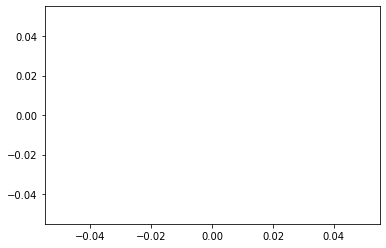

In [66]:
"""
  plot model weights
"""
plt.plot(net_p1.log_dic["model_weight_step"])
plt.show()

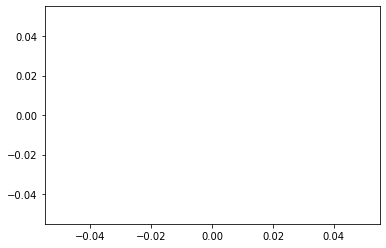

In [67]:
"""
  plot model learnrate
"""
plt.plot(net_p1.log_dic["learnrate"])
plt.show()

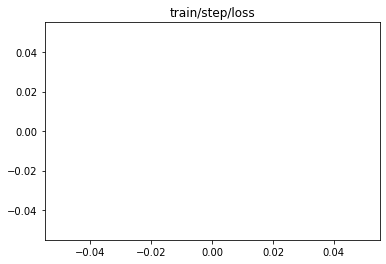

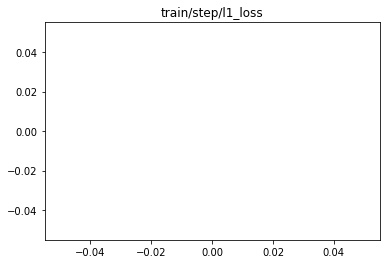

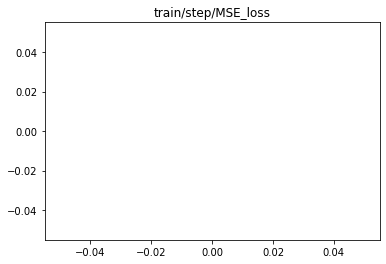

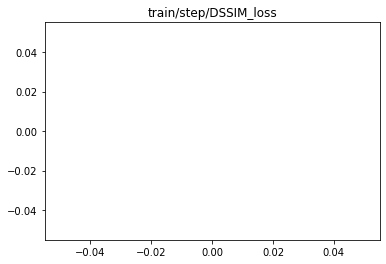

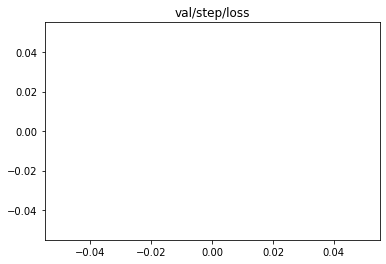

...

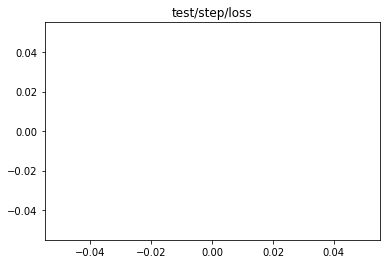

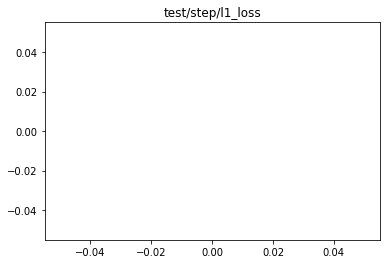

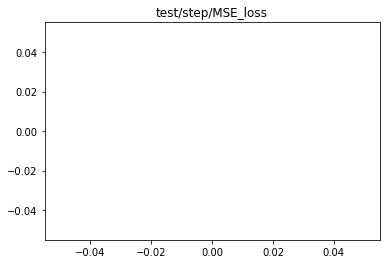

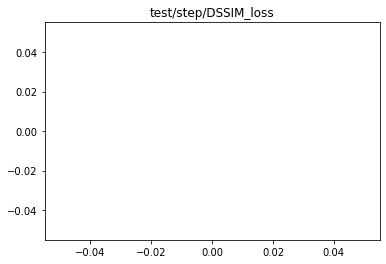

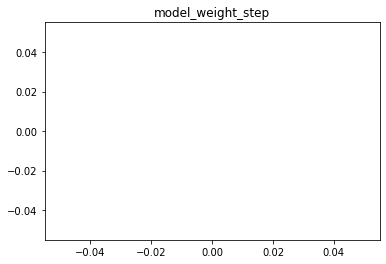

[]


In [68]:
"""
  plot all graphs from the log_dic(no tensorboard)
"""
# log_dic = torch.load("L.logs")
log_dic = net_p1.log_dic
for ele in log_dic.items():
  key,data = ele
  if "step" not in key:
    continue
  plt.plot(data)
  plt.title(key)
  plt.show()
print(log_dic["retrained"])

In [69]:
"""
  sum up the steps of the training epoches for the real number of steps at each stop
"""
net_p1.log_dic["retrained"] = [sum(net_p1.log_dic["retrained"][:(i+1)]) for i in range(len(net_p1.log_dic["retrained"]))]
print(net_p1.log_dic["retrained"])

[]


In [70]:
""" 
  Save custom logs and model as checkpoint
"""
filen = "big_final"
net_p1 = net_p1.to('cpu')
net_p1.save_logs(filen+".logs")
trainer.save_checkpoint(filen+".ptl")

In [71]:
"""
  Load model as checkpoint
"""
filen = "big_final"
net_p1 = pred_Project.load_from_checkpoint(filen+".ptl",map_location=torch.device(device))
net_p1.log_dic = torch.load(filen+".logs")

FileNotFoundError: ignored

In [ ]:
"""
  Run test on model
"""
trainer.test(net_p1)

In [72]:
def create_gif(filename,images,duration):
  tf = transforms.ToPILImage()
  tmp_l = []
  for img in images:
    tmp_l.append(tf(img.detach().cpu()))
  tmp_l[0].save(filename,
               save_all=True,
               append_images=tmp_l[1:],
               duration=duration,
               loop=0)

In [74]:
from PIL import ImageOps

In [75]:
"""
  This function applies a colored border to a frame
"""
def square_border(pred_frame, color,border):
    """
    Args:
      pred_frame (Tensor Image): Input image.
      color: color name to fill border
    Returns:
      Tensor Image: green rectangle bordered image.
    """
    _, w, h = pred_frame.size()
    img = transforms.ToPILImage(mode='RGB')(pred_frame.cpu())
    if color == "green":
      bordered = ImageOps.expand(img, border=border, fill=(0,128,0))
    elif color == "red":
      bordered = ImageOps.expand(img, border=border, fill=(255,0,0))
    elif color == "cyan":
      bordered = ImageOps.expand(img, border=border, fill=(0,255,255))
    else:
      bordered = ImageOps.expand(img, border=border, fill=(0,0,0))
    bordered = bordered.resize((w,h))
    return transforms.ToTensor()(bordered)

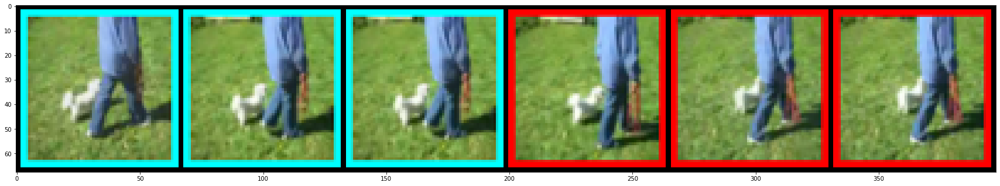

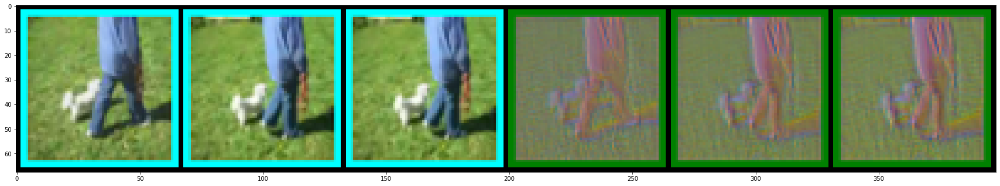

In [87]:
"""
  Test the quality of our model for the 3 seed frames + 3 predicted frames
"""
mode = "test"
net_p1 = net_p1.to(device)
if mode == "train":
  dset = ufc101_dset_train
else:
  dset = ufc101_dset_test
rnd_number = int(torch.randint(len(dset),size=(1,)))
#rnd_number = 9515
#print(rnd_number)
tmp = dset.__getitem__(rnd_number)[0]
tmp = tmp.to(device)
tmp = tmp.permute(0,3,1,2)
chosen_batch,chosen_labels = build_batch_and_labels(tmp.view((1,)+tmp.shape),inp_dim,mode)

batch = torch.cat(chosen_batch,dim=0)
labels = torch.cat(chosen_labels,dim=0)
labels = tensor_generic_transformation(labels,unNorm)
tmp = tensor_generic_transformation(batch.clone(),unNorm)
tmp = tensor_resize(tmp,inp_dim//2)

# truth
truth_frames = torch.cat([tmp,labels],dim=0)
# imshow(truth_frames,(30,20))
net_p1.reset_convGRU(1)
pred_frames = []

for frame in batch:
  pred = net_p1(frame.view((1,)+frame.shape).to(device))
  pred_frames.append(pred)

pred_frames = torch.cat(pred_frames,dim=0)
pred_frames = tensor_generic_transformation(pred_frames,unNorm)
# prediction
tmp = tmp.to(device)
pred_frames = pred_frames.to(device)
pred_frames = torch.cat([tmp,pred_frames],dim=0)
# imshow(pred_frames,(30,20))


"""
  add colored borders to prediction and truth frames
"""
to_convert = [truth_frames,pred_frames]

colors = ["red","green"]
for j in range(len(to_convert)):
  for ind,frame in enumerate(to_convert[j]):
    if ind < 3:
      to_convert[j][ind] = square_border(frame,"cyan",3)
    else:
      to_convert[j][ind] = square_border(frame,colors[j],3)

imshow(truth_frames,(30,20))
imshow(pred_frames,(30,20))


Below there are a lot of cells which mainly were used to create pictures for our report

In [77]:
blurry_images = []
blurr_com = []

In [78]:
blurry_images.append(pred_frames[3])
blurr_com.append(truth_frames[3])

In [79]:
img_l1 = torch.stack(blurry_images)
img_l2 = torch.stack(blurr_com)
blurry_comparer = torch.cat([img_l2,img_l1])

In [80]:
blurry_comparer_r = tensor_resize(blurry_comparer,512)

In [81]:
blurry_comparer = blurry_comparer_r

In [82]:
blurry_comparer = torchvision.utils.make_grid(blurry_comparer,nrow=4)

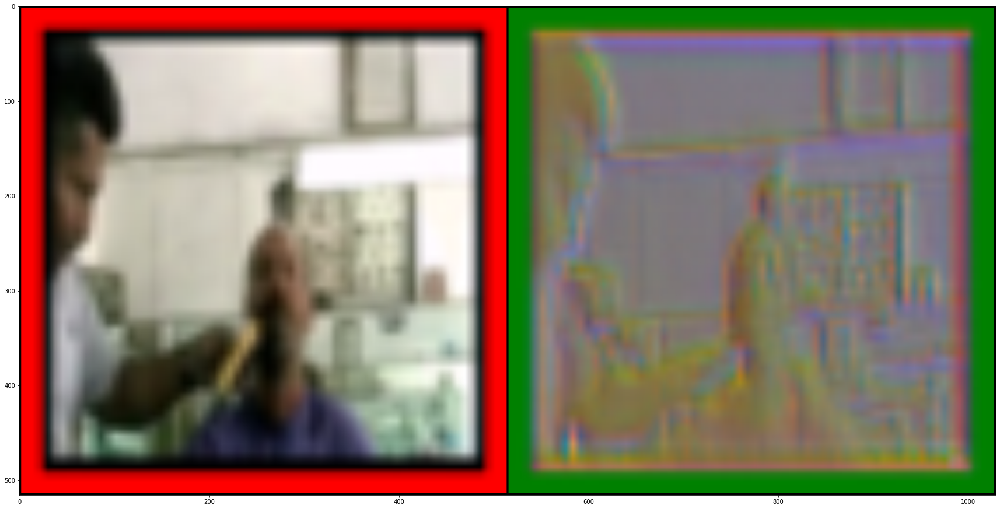

In [83]:
imshow(blurry_comparer,(30,20))

In [88]:
#blurry_images = torch.load("blurry_small.pics",map_location=torch.device(device))

In [89]:
#blurry_comparer = torch.load("blurry_small_final_512.pics",map_location=torch.device(device))

In [ ]:
torch.save(blurry_comparer,"blurry_big_final_512.pics")

In [ ]:
#torchvision.utils.save_image(blurry_comparer,"blurry_big_512.pdf")

In [ ]:
#torchvision.utils.save_image(pred_frames,"blurry_big_comp.pdf")

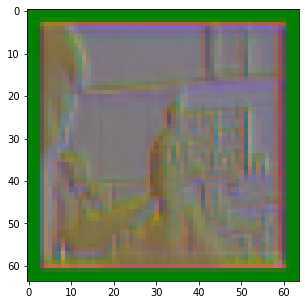

In [90]:
imshow(torch.stack(blurry_images),(20,5))

In [91]:
# cell to plot/save upsampled truth vs prediction
truth = truth_frames.clone()
pred = pred_frames.clone()
#upsampling
sc = 4
truth = tensor_resize(truth,truth.shape[2]*sc)
pred = tensor_resize(pred,pred.shape[2]*sc)

truth_pred = torch.cat([truth,pred],dim=0)
# plot truth and pred as images
truth_pred_g = torchvision.utils.make_grid(truth_pred,nrow=6)
# imshow(truth_pred_g)
torchvision.utils.save_image(truth_pred_g,"truth_pred.png")

# plot model and truth as gif
loop = 300
create_gif("truth.gif",truth,loop)
create_gif("pred.gif",pred,loop)

# zip the results for easier download
!zip results.zip truth.gif pred.gif truth_pred.png
!rm truth.gif pred.gif truth_pred.png

  adding: truth.gif (deflated 40%)
  adding: pred.gif (deflated 47%)
  adding: truth_pred.png (deflated 0%)


In [92]:
!pip install torchviz
from torchviz import make_dot

     |████████████████████████████████| 51kB 3.2MB/s 
  Created wheel for torchviz: filename=torchviz-0.0.1-cp36-none-any.whl size=3520 sha256=cd3a16123299b9f84190b8347bce0f08caba14ca67f3204c0169b166678d96f5
  Stored in directory: /root/.cache/pip/wheels/2a/c2/c5/b8b4d0f7992c735f6db5bfa3c5f354cf36502037ca2b585667
Successfully built torchviz


In [93]:
"""
 Try to visualize computation graph
"""
mode = "train"
net_p1 = net_p1.to(device)
if mode == "train":
  dset = ufc101_dset_train
else:
  dset = ufc101_dset_test
rnd_number = int(torch.randint(len(dset),size=(1,)))
print(rnd_number)
tmp = dset.__getitem__(rnd_number)[0]
tmp = tmp.to(device)
tmp = tmp.permute(0,3,1,2)
chosen_batch,chosen_labels = build_batch_and_labels(tmp.view((1,)+tmp.shape),inp_dim,mode)
batch = torch.cat(chosen_batch,dim=0)

net_p1.reset_convGRU(1)
frame = Variable(batch[0])
pred = net_p1(frame.view((1,)+frame.shape).to(device))

make_dot(pred,params=dict(net_p1.named_parameters()))

16045


In [99]:
%cd "/content"
!ls

/content
drive	     small2.logs  UCF101TrainTestSplits-RecognitionTask.zip
logs	     small2.ptl   ucfTrainTestlist
results.zip  UCF-101
sample_data  UCF101.rar


In [95]:
%cd "/content/drive/My Drive/Colab Notebooks"
!ls

/content/drive/My Drive/Colab Notebooks
 classification_model_tl.ipynb	    pred_model_tl_thefinal.ipynb
'Copy of pred_model_tl_V12.ipynb'   train_model_1_V_tl.ipynb
'Cuda Vision Project'		    UCF101.rar
 logs				    UCF101TrainTestSplits-RecognitionTask.zip


In [96]:
%reload_ext tensorboard

In [97]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>